In [27]:
import pandas as pd
import torch
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image


from CUB.utils import get_cub_attributes
from CUB.dataset import ImageTransformer
from CUB.saliency_utily import aggregate_attributions, normalize_map, overlay_on_image

from captum.attr import IntegratedGradients, Saliency, NoiseTunnel

In [19]:
cub_attributes_list = get_cub_attributes()

In [20]:
certainties = {
    1: "not visible",
    2: "guessing",
    3: "probably",
    4: "definitely",
}

data_path = "./data/CUB_200_2011/"

image_attributes_file = data_path + "attributes/image_attribute_labels.txt"
attributes_names = data_path + "attributes/attributes.txt"

attributes_names_df = pd.read_csv(
    attributes_names,
    sep=" ",
    header=None,
    names=["attribute_id", "attribute_name"],
)
attributes_names = attributes_names_df.set_index("attribute_id")["attribute_name"].to_dict()

# <image_id> <attribute_id> <is_present> <certainty_id> <time>
image_attributes = pd.read_csv(
    image_attributes_file,
    sep=" ",
    header=None,
    names=[
        "image_id",
        "attribute_id",
        "is_present",
        "certainty_id",
        "time",
    ],
)

# select only the attributes that are in cub_attributes_list
image_attributes_cub = image_attributes[
    image_attributes["attribute_id"].isin(cub_attributes_list)
]


image_adresses = pd.read_csv(
    data_path + "images.txt",
    sep=" ",
    header=None,
    names=["image_id", "image_path"],
)


image_attributes_cub.tail()

,image_id,attribute_id,is_present,certainty_id,time
3677848,11788,305,0,4,4.989
3677851,11788,308,1,4,4.989
3677852,11788,309,0,4,8.309
3677853,11788,310,0,4,8.309
3677854,11788,311,0,4,8.309


In [21]:
def random_sample():
    random_image_id = np.random.choice(
        image_attributes_cub["image_id"].unique()
    )

    random_image_attributes = image_attributes_cub[image_attributes_cub["image_id"] == random_image_id]
    present_attributes = random_image_attributes[random_image_attributes["is_present"] == 1]

    visible_attr = present_attributes.attribute_id.map(attributes_names).to_list()
    visible_attr_indx = present_attributes.attribute_id.to_list()

    image_path = image_adresses[image_adresses["image_id"] == random_image_id]["image_path"].values[0]
    image_path = data_path + "images/" + image_path

    image = Image.open(image_path)

    transformer = ImageTransformer(is_training=False)
    image_tensor = transformer(image).unsqueeze(0)  # Add batch dimension   

    return image_tensor, visible_attr, visible_attr_indx


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-4.053115898461357e-09..1.0000000236034394].


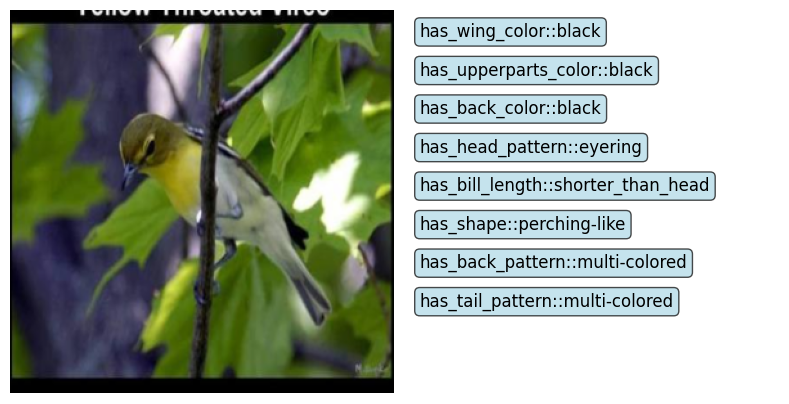

In [22]:
im_tensor, visible_attr, visible_attr_indx = random_sample()
image = torch.einsum("bchw->bhwc", im_tensor).squeeze(0).numpy()
# denormalize imagenet im
plot_im = image * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])

# Create figure and axis
fig, ax = plt.subplots(1, 1, figsize=(8, 6))
ax.imshow(plot_im)

# Add visible attributes as text to the right of the image
image_width = plot_im.shape[0]
y_start = 10
y_spacing = 30

for i, attr in enumerate(visible_attr):
    ax.text(image_width + 20, y_start + i * y_spacing, attr, 
            fontsize=12, verticalalignment='top', 
            bbox=dict(boxstyle="round,pad=0.3", facecolor="lightblue", alpha=0.7))

# Adjust plot limits to show the text
ax.set_xlim(0, image_width + 300)
ax.set_ylim(plot_im.shape[1], 0)  # Invert y-axis to match image coordinates
ax.axis('off')  # Remove axes

plt.tight_layout()
plt.show()

In [23]:
model = torch.load("CUB/pretrained/best_model_3.pth", map_location="cpu", weights_only=False)
model

/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/torch/serialization.py:1639: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/torch/serialization.py:1639: SourceChangeWarning: source code of class 'torch.nn.modules.batchnorm.BatchNorm2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/torch/serialization.py:1639: SourceChangeWarning: source code of class 'torch.nn.modules.container.ModuleLis

Inception3(
  (Conv2d_1a_3x3): BasicConv2d(
    (conv): Conv2d(3, 32, kernel_size=(3, 3), stride=(2, 2), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2a_3x3): BasicConv2d(
    (conv): Conv2d(32, 32, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(32, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_2b_3x3): BasicConv2d(
    (conv): Conv2d(32, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
    (bn): BatchNorm2d(64, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_3b_1x1): BasicConv2d(
    (conv): Conv2d(64, 80, kernel_size=(1, 1), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(80, eps=0.001, momentum=0.1, affine=True, track_running_stats=True)
  )
  (Conv2d_4a_3x3): BasicConv2d(
    (conv): Conv2d(80, 192, kernel_size=(3, 3), stride=(1, 1), bias=False)
    (bn): BatchNorm2d(192, eps=0.001, momentum=0.1, affine=True, t

In [24]:
im_tensor, visible_attr, visible_attr_indx = random_sample()

# Ensure model is in eval mode if doing inference
model.eval()

# Run with gradient context if needed
with torch.enable_grad():
    output = model(im_tensor)
    attr_outputs = [torch.nn.Sigmoid()(o) for o in output]


In [25]:

import torch.nn as nn

class TensorOutputWrapper(nn.Module):
    """
    Wrap a model that returns a list into one that returns a tensor.
    You can choose which element (or combine them) for attribution.
    """
    def __init__(self, model, out_index=0):
        super().__init__()
        self.model = model
        self.out_index = out_index

    def forward(self, x):
        out = self.model(x)
        # If model returns a list, select one element or concatenate them
        if isinstance(out, (list, tuple)):
            out = out[self.out_index]
        # Now ensure it's a tensor
        assert isinstance(out, torch.Tensor), "Selected output must be a tensor"
        return out

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.003921580076217679..1.0000000236034394].


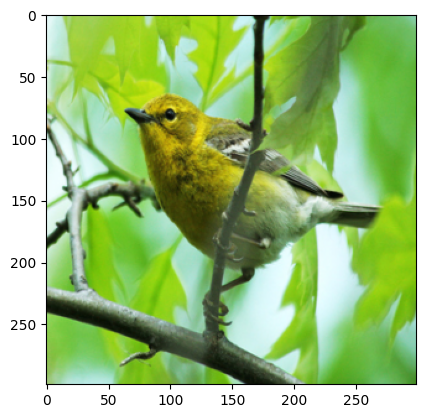

In [171]:
im_tensor, visible_attr, visible_attr_indx = random_sample()
plot_im = torch.einsum("bchw->bhwc", im_tensor).squeeze(0).numpy()
plot_im = plot_im * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
plt.imshow(plot_im)

/tmp/ipykernel_1597784/2426832055.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))
/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


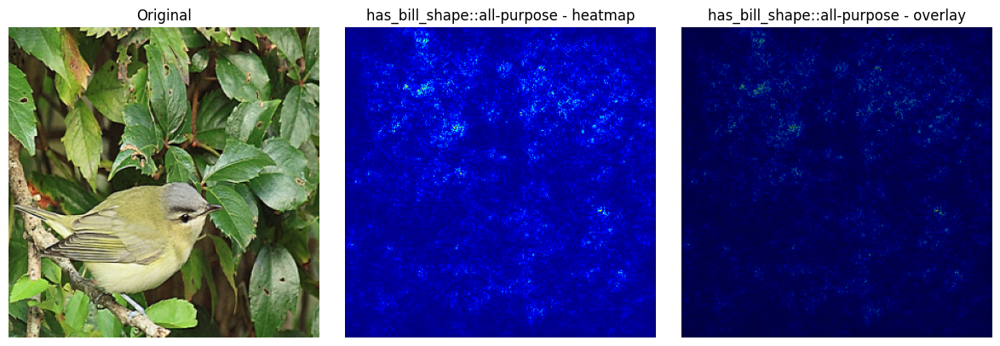

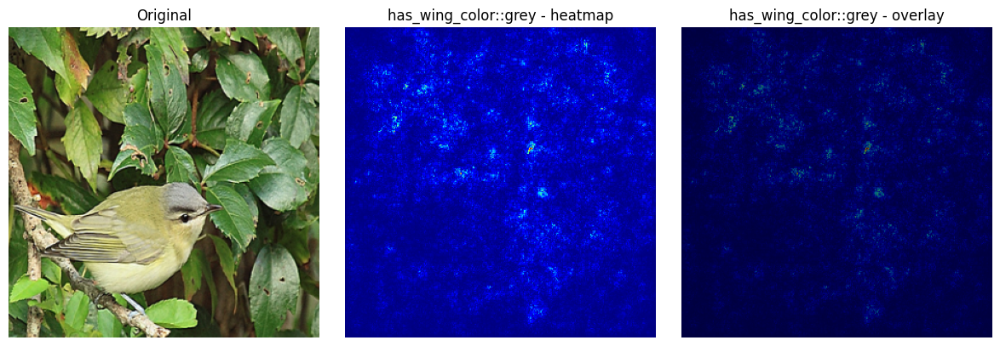

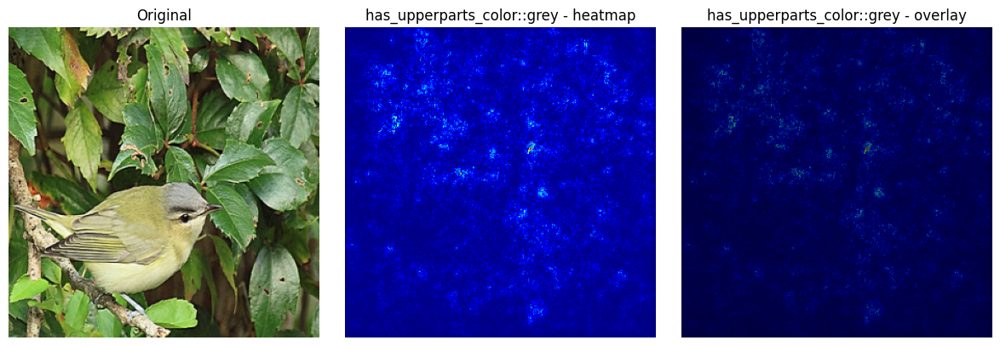

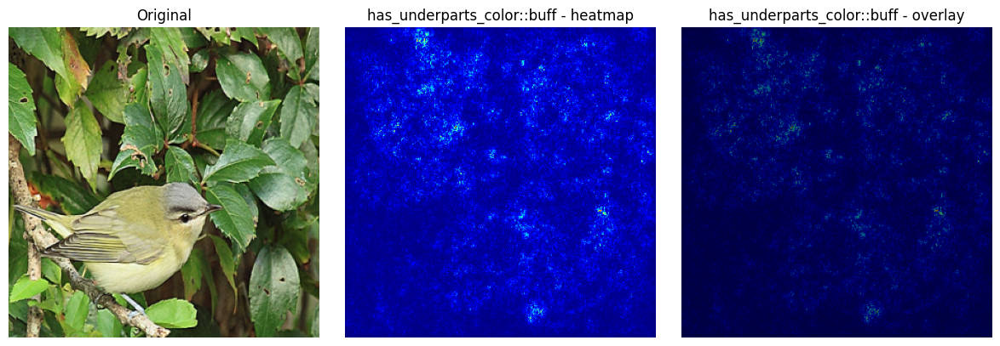

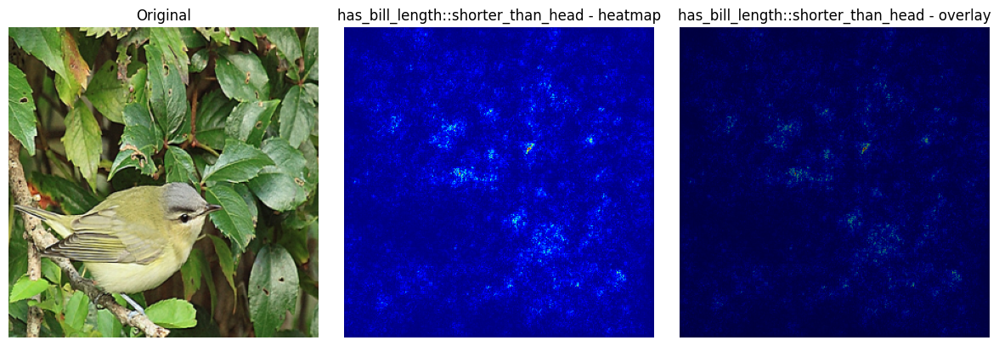

In [26]:
im_tensor, visible_attr, visible_attr_indx = random_sample()
image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))

for attr_name, attr_idx in zip(visible_attr, visible_attr_indx[:5]):
    # Use the single attribute index (attr_idx) instead of the entire list
    output_index = cub_attributes_list.index(attr_idx)
    wrapped_model = TensorOutputWrapper(model, out_index=output_index)

    expl = Saliency(wrapped_model)
    attributions = expl.attribute(im_tensor, target=0)

    channel_reduction = "absolute_mean"

    agg = aggregate_attributions(attributions, method=channel_reduction)  # (B,H,W)
    norm = normalize_map(agg)  # (B,H,W)
    # show first sample
    heat = norm[0]
    overlay = overlay_on_image(image_np, heat, alpha=0.5)
    fig, ax = plt.subplots(1,3, figsize=(12,4))
                
    # reverse this norm transforms.Normalize(mean = [ 0.485, 0.456, 0.406 ], std = [ 0.229, 0.224, 0.225 ]),
    reversed_im = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    plot_im = (reversed_im - reversed_im.min()) / (reversed_im.max() - reversed_im.min())
 
    ax[0].imshow(plot_im)

    ax[0].set_title("Original")
    ax[1].imshow(heat, cmap='jet')
    ax[1].set_title(f"{attr_name} - heatmap")

    ax[2].imshow(overlay)
    ax[2].set_title(f"{attr_name} - overlay")  # Fixed: was ax[1]
    for a in ax: a.axis('off')
    plt.tight_layout()
    plt.show()

In [32]:
method_name

'Smooth Grad'

In [36]:
visible_attr

['has_bill_length::shorter_than_head',
 'has_under_tail_color::black',
 'has_tail_pattern::multi-colored']

[10, 14, 15, 20, 21, 23]

/tmp/ipykernel_1597784/348959781.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))
/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


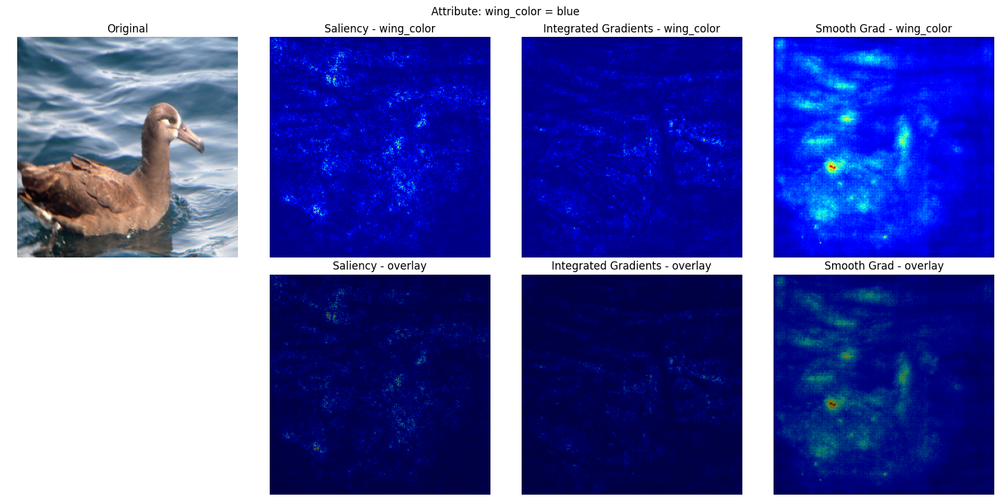

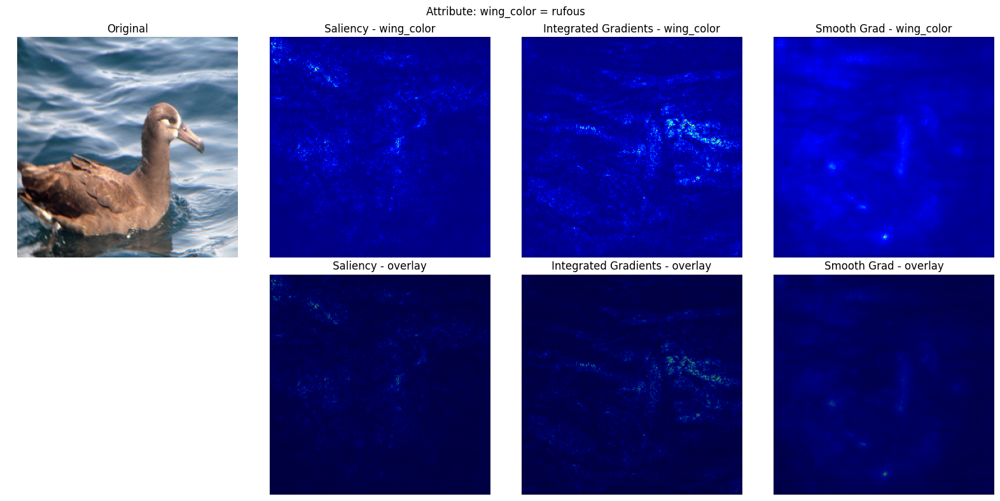

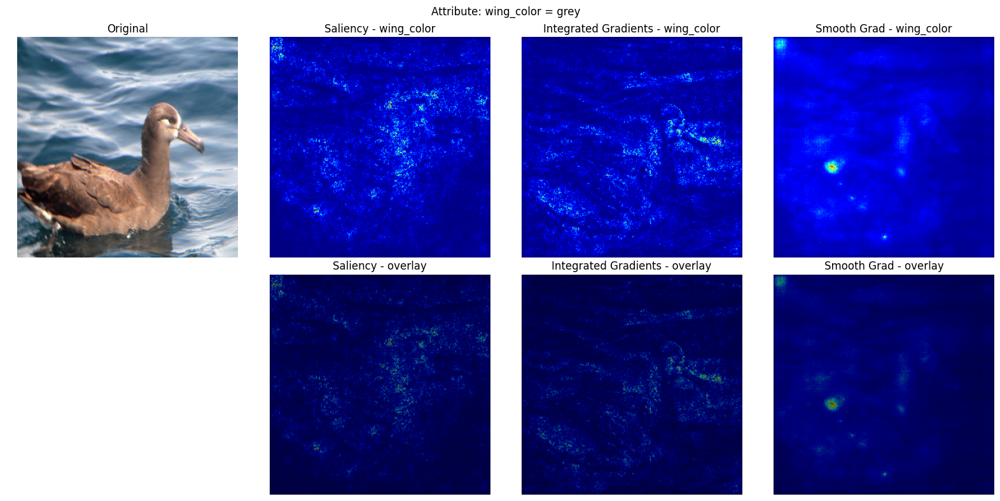

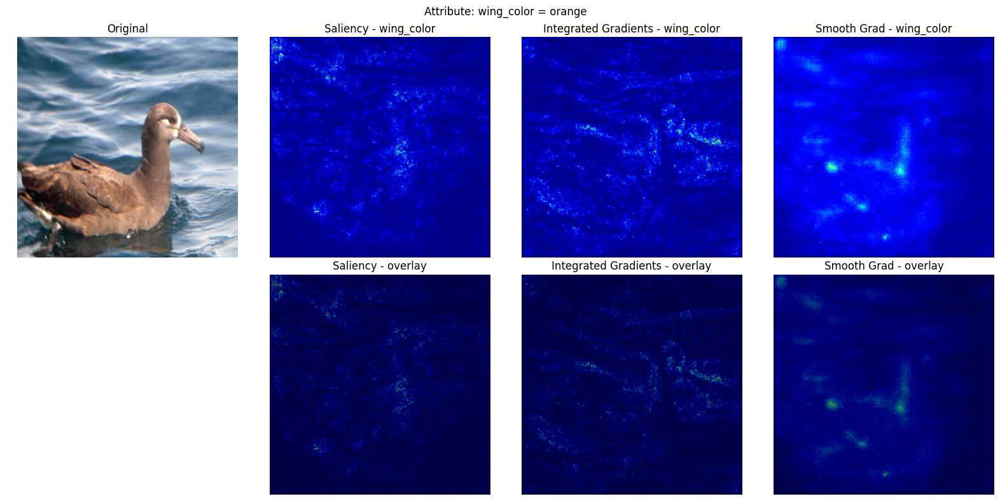

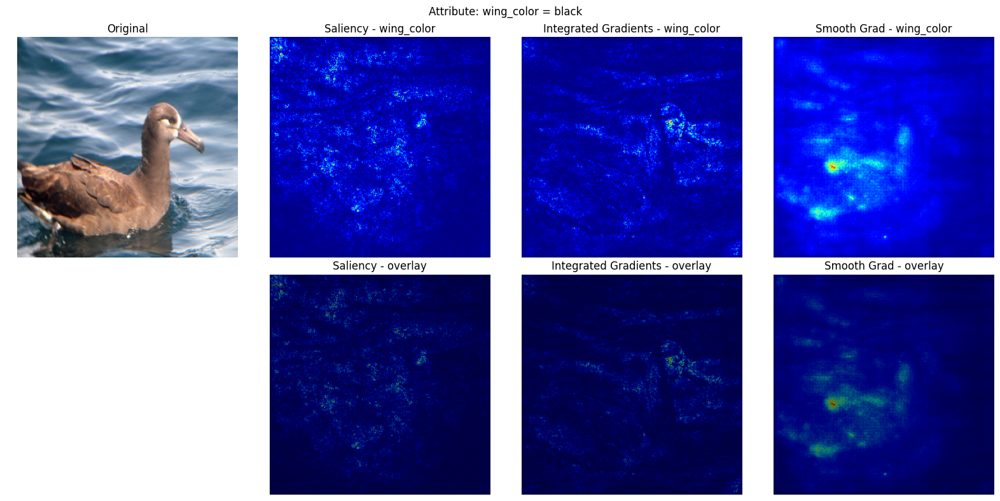

  attribute_key attribute_value                method
0    wing_color            blue              Saliency
1    wing_color            blue  Integrated Gradients
2    wing_color            blue           Smooth Grad
3    wing_color          rufous              Saliency
4    wing_color          rufous  Integrated Gradients


In [41]:

im_tensor, visible_attr, visible_attr_indx = random_sample()
image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))


visible_attr = [
    "has_wing_color::blue",
    "has_wing_color::brown",
    "has_wing_color::iridescent",
    "has_wing_color::purple",
    "has_wing_color::rufous",
    "has_wing_color::grey",
    "has_wing_color::yellow",
    "has_wing_color::olive",
    "has_wing_color::green",
    "has_wing_color::pink",
    "has_wing_color::orange",
    "has_wing_color::black",
    "has_wing_color::white",
    "has_wing_color::red",
    "has_wing_color::buff",
]
visible_attr_indx = list(range(10, 25))
valid_visible_attr = [i in cub_attributes_list for i in visible_attr_indx]
# select visible attr and visible attr indx based on valid_visible_attr
visible_attr = [attr for attr, valid in zip(visible_attr, valid_visible_attr) if valid]
visible_attr_indx = [idx for idx, valid in zip(visible_attr_indx, valid_visible_attr) if valid]



# Create dataframe to store results
results_data = []


for attr_name, attr_idx in zip(visible_attr, visible_attr_indx[:5]):
    # Parse attribute name to extract key and value
    if "::" in attr_name and attr_name.startswith("has_"):
        # Remove "has_" prefix and split by "::"
        cleaned_name = attr_name[4:]  # Remove "has_"
        key, value = cleaned_name.split("::", 1)
    else:
        # Fallback for different formats
        key = attr_name
        value = ""
    
    output_index = cub_attributes_list.index(attr_idx)
    wrapped_model = TensorOutputWrapper(model, out_index=output_index)

    # Saliency
    saliency = Saliency(wrapped_model)
    sal_attributions = saliency.attribute(im_tensor, target=0)
    
    # Integrated Gradients
    ig = IntegratedGradients(wrapped_model)
    ig_attributions = ig.attribute(im_tensor, target=0)
    
    # Smooth Grad (using NoiseTunnel with Saliency)
    smooth_grad = NoiseTunnel(saliency)
    sg_attributions = smooth_grad.attribute(im_tensor, target=0, nt_type='smoothgrad', nt_samples=50)

    methods = {
        'Saliency': sal_attributions,
        'Integrated Gradients': ig_attributions, 
        'Smooth Grad': sg_attributions
    }

    channel_reduction = "absolute_mean"

    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.flatten()

    # reverse norm transforms
    reversed_im = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    plot_im = (reversed_im - reversed_im.min()) / (reversed_im.max() - reversed_im.min())
    
    axes[0].imshow(plot_im)
    axes[0].set_title("Original")
    axes[0].axis('off')

    for idx, (method_name, attributions) in enumerate(methods.items(), 1):
        agg = aggregate_attributions(attributions, method=channel_reduction)
        norm = normalize_map(agg)
        heat = norm[0]
        overlay = overlay_on_image(image_np, heat, alpha=0.5)
        
        # Heatmap
        axes[idx].imshow(heat, cmap='jet')
        axes[idx].set_title(f"{method_name} - {key}")
        axes[idx].axis('off')
        
        # Overlay - skip axes[4] (row 2 col 1)
        overlay_idx = idx + 1 if idx > 3 else idx + 0
        axes[idx+4].imshow(overlay)
        axes[idx+4].set_title(f"{method_name} - overlay")
        axes[idx+4].axis('off')
        
        # Store results
        results_data.append({
            'attribute_key': key,
            'attribute_value': value,
            'method': method_name,
            'attributions': attributions,
            'heatmap': heat,
            'overlay': overlay
        })

    # Hide unused subplots (row 2 col 1 and last one)
    axes[4].axis('off')  # Row 2 Col 1 - empty
    axes[7].axis('off')  # Last subplot
    
    plt.suptitle(f"Attribute: {key} = {value}")
    plt.tight_layout()
    plt.show()

# Create DataFrame with results
df = pd.DataFrame(results_data)
print(df[['attribute_key', 'attribute_value', 'method']].head())

In [ ]:

im_tensor, visible_attr, visible_attr_indx = random_sample()
image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))

for attr_name, attr_idx in zip(visible_attr, visible_attr_indx[:5]):
    # Use the single attribute index (attr_idx) instead of the entire list
    output_index = cub_attributes_list.index(attr_idx)
    wrapped_model = TensorOutputWrapper(model, out_index=output_index)

    # Replace Saliency with IntegratedGradients
    ig = IntegratedGradients(wrapped_model)
    
    # Compute attributions with Integrated Gradients
    # n_steps controls the approximation quality (default=50, higher is more accurate)
    attributions = ig.attribute(im_tensor, target=0, n_steps=50)

    channel_reduction = "absolute_mean"

    agg = aggregate_attributions(attributions, method=channel_reduction)  # (B,H,W)
    norm = normalize_map(agg)  # (B,H,W)
    # show first sample
    heat = norm[0]
    overlay = overlay_on_image(image_np, heat, alpha=0.5)
    fig, ax = plt.subplots(1,3, figsize=(12,4))
                
    # reverse this norm transforms.Normalize(mean = [ 0.485, 0.456, 0.406 ], std = [ 0.229, 0.224, 0.225 ]),
    reversed_im = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
    plot_im = (reversed_im - reversed_im.min()) / (reversed_im.max() - reversed_im.min())
 
    ax[0].imshow(plot_im)

    ax[0].set_title("Original")
    ax[1].imshow(heat, cmap='jet')
    ax[1].set_title(f"{attr_name} - heatmap (IG)")

    ax[2].imshow(overlay)
    ax[2].set_title(f"{attr_name} - overlay (IG)")
    for a in ax: a.axis('off')
    plt.tight_layout()
    plt.show()

/var/folders/0s/djcnggfx34j59ddzgqd699z80000gn/T/ipykernel_2044/791498550.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))


/tmp/ipykernel_1597784/1966874671.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))
/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


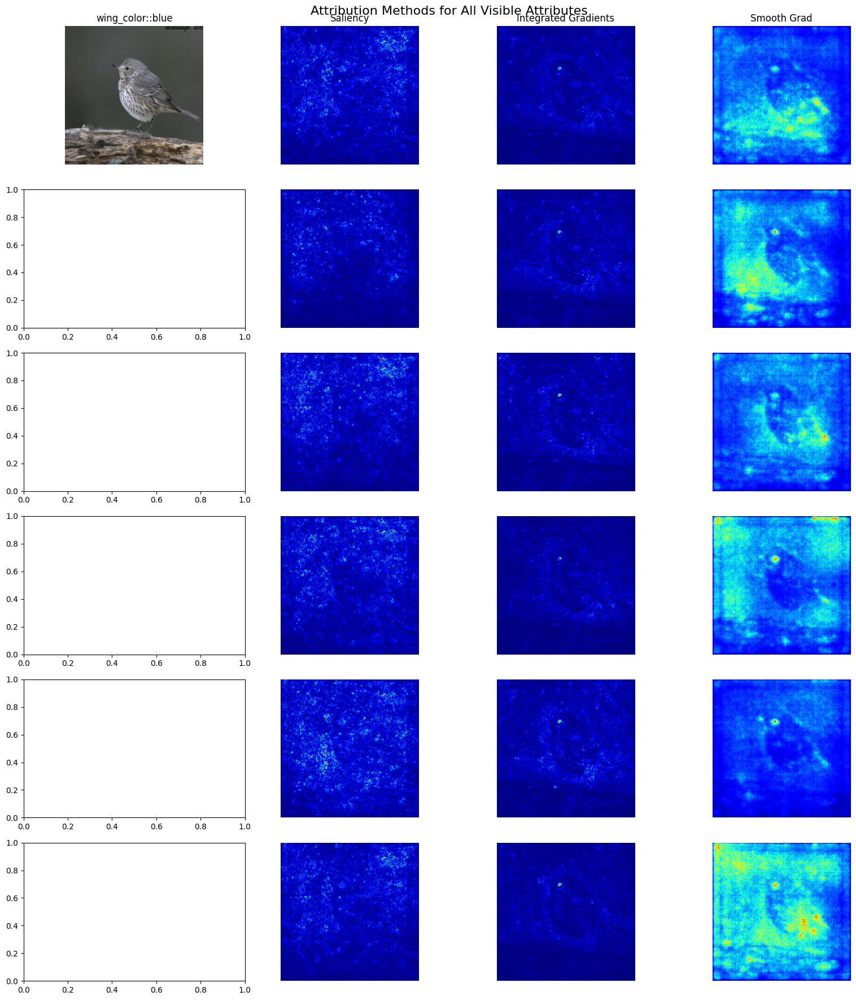

  attribute_key attribute_value                method
0    wing_color            blue              Saliency
1    wing_color            blue  Integrated Gradients
2    wing_color            blue           Smooth Grad
3    wing_color          rufous              Saliency
4    wing_color          rufous  Integrated Gradients


In [43]:
im_tensor, visible_attr, visible_attr_indx = random_sample()
image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))

visible_attr = [
    "has_wing_color::blue",
    "has_wing_color::brown",
    "has_wing_color::iridescent",
    "has_wing_color::purple",
    "has_wing_color::rufous",
    "has_wing_color::grey",
    "has_wing_color::yellow",
    "has_wing_color::olive",
    "has_wing_color::green",
    "has_wing_color::pink",
    "has_wing_color::orange",
    "has_wing_color::black",
    "has_wing_color::white",
    "has_wing_color::red",
    "has_wing_color::buff",
]
visible_attr_indx = list(range(10, 25))
valid_visible_attr = [i in cub_attributes_list for i in visible_attr_indx]
visible_attr = [attr for attr, valid in zip(visible_attr, valid_visible_attr) if valid]
visible_attr_indx = [idx for idx, valid in zip(visible_attr_indx, valid_visible_attr) if valid]

# Create dataframe to store results
results_data = []

# Calculate grid dimensions
num_attrs = len(visible_attr)
num_methods = 3  # Saliency, IG, Smooth Grad
cols = num_methods + 1  # +1 for original image column
rows = num_attrs

# Create single figure for all attributes
fig, axes = plt.subplots(rows, cols, figsize=(cols * 4, rows * 3))
if rows == 1:
    axes = axes.reshape(1, -1)

# Reverse norm transforms (only once)
reversed_im = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
plot_im = (reversed_im - reversed_im.min()) / (reversed_im.max() - reversed_im.min())

for row_idx, (attr_name, attr_idx) in enumerate(zip(visible_attr, visible_attr_indx)):
    # Parse attribute name
    if "::" in attr_name and attr_name.startswith("has_"):
        cleaned_name = attr_name[4:]
        key, value = cleaned_name.split("::", 1)
    else:
        key = attr_name
        value = ""
    
    output_index = cub_attributes_list.index(attr_idx)
    wrapped_model = TensorOutputWrapper(model, out_index=output_index)

    # Compute attributions
    saliency = Saliency(wrapped_model)
    sal_attributions = saliency.attribute(im_tensor, target=0)
    
    ig = IntegratedGradients(wrapped_model)
    ig_attributions = ig.attribute(im_tensor, target=0)
    
    smooth_grad = NoiseTunnel(saliency)
    sg_attributions = smooth_grad.attribute(im_tensor, target=0, nt_type='smoothgrad', nt_samples=50)

    methods = {
        'Saliency': sal_attributions,
        'Integrated Gradients': ig_attributions, 
        'Smooth Grad': sg_attributions
    }

    channel_reduction = "absolute_mean"
    
    # Plot original image in first column
    if row_idx == 0:
        axes[row_idx, 0].imshow(plot_im)
        axes[row_idx, 0].set_title(f"{key}::{value}")
        axes[row_idx, 0].axis('off')
    
    # Plot each method's heatmap
    for col_idx, (method_name, attributions) in enumerate(methods.items(), 1):
        agg = aggregate_attributions(attributions, method=channel_reduction)
        norm = normalize_map(agg)
        heat = norm[0]
        
        axes[row_idx, col_idx].imshow(heat, cmap='jet')
        if row_idx == 0:  # Only show method name in first row
            axes[row_idx, col_idx].set_title(method_name)
        axes[row_idx, col_idx].axis('off')
        
        # Store results
        results_data.append({
            'attribute_key': key,
            'attribute_value': value,
            'method': method_name,
            'attributions': attributions,
            'heatmap': heat
        })

plt.suptitle("Attribution Methods for All Visible Attributes", fontsize=16)
plt.tight_layout()
plt.show()

# Create DataFrame with results
df = pd.DataFrame(results_data)
print(df[['attribute_key', 'attribute_value', 'method']].head())

/tmp/ipykernel_1597784/306450144.py:2: DeprecationWarning: __array__ implementation doesn't accept a copy keyword, so passing copy=False failed. __array__ must implement 'dtype' and 'copy' keyword arguments. To learn more, see the migration guide https://numpy.org/devdocs/numpy_2_0_migration_guide.html#adapting-to-changes-in-the-copy-keyword
  image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))
/home/mo81doja/ConceptBottleneckEval/.venv/lib/python3.12/site-packages/captum/_utils/gradient.py:57: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  warnings.warn(


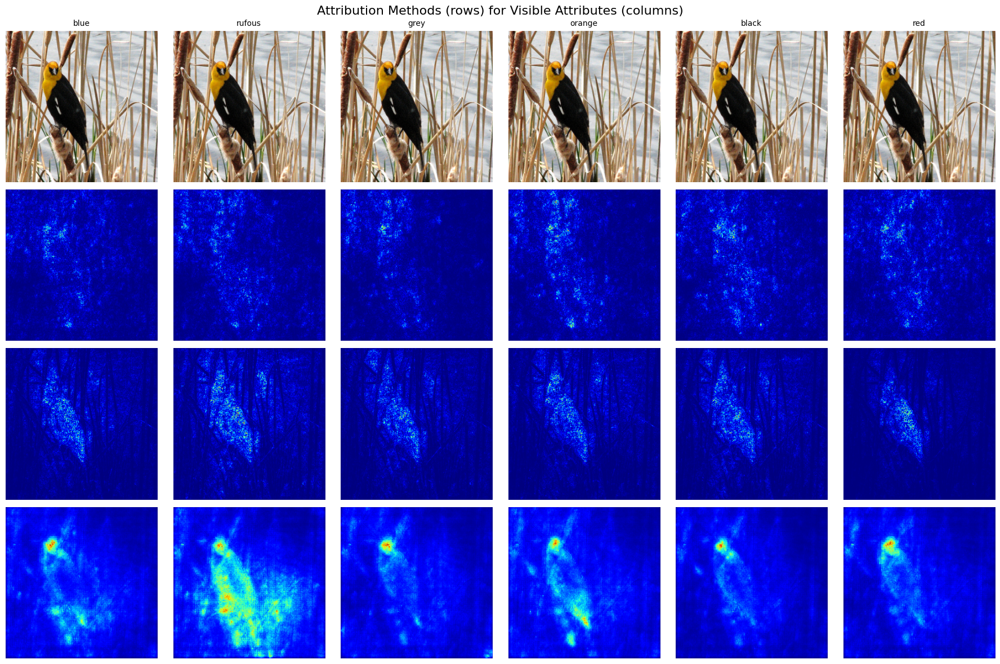

  attribute_key attribute_value    method
0    wing_color            blue  Saliency
1    wing_color          rufous  Saliency
2    wing_color            grey  Saliency
3    wing_color          orange  Saliency
4    wing_color           black  Saliency


In [44]:
im_tensor, visible_attr, visible_attr_indx = random_sample()
image_np = np.array(im_tensor.detach().cpu()[0].permute(1, 2, 0))

visible_attr = [
    "has_wing_color::blue",
    "has_wing_color::brown",
    "has_wing_color::iridescent",
    "has_wing_color::purple",
    "has_wing_color::rufous",
    "has_wing_color::grey",
    "has_wing_color::yellow",
    "has_wing_color::olive",
    "has_wing_color::green",
    "has_wing_color::pink",
    "has_wing_color::orange",
    "has_wing_color::black",
    "has_wing_color::white",
    "has_wing_color::red",
    "has_wing_color::buff",
]
visible_attr_indx = list(range(10, 25))
valid_visible_attr = [i in cub_attributes_list for i in visible_attr_indx]
visible_attr = [attr for attr, valid in zip(visible_attr, valid_visible_attr) if valid]
visible_attr_indx = [idx for idx, valid in zip(visible_attr_indx, valid_visible_attr) if valid]

# Create dataframe to store results
results_data = []

# Calculate grid dimensions
num_attrs = len(visible_attr)
num_methods = 3  # Saliency, IG, Smooth Grad
rows = num_methods + 1  # +1 for original image row
cols = num_attrs

# Create single figure for all attributes
fig, axes = plt.subplots(rows, cols, figsize=(cols * 3, rows * 3))
if cols == 1:
    axes = axes.reshape(-1, 1)

# Reverse norm transforms (only once)
reversed_im = image_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
plot_im = (reversed_im - reversed_im.min()) / (reversed_im.max() - reversed_im.min())

# Compute all attributions first
all_attributions = []
for attr_name, attr_idx in zip(visible_attr, visible_attr_indx):
    # Parse attribute name
    if "::" in attr_name and attr_name.startswith("has_"):
        cleaned_name = attr_name[4:]
        key, value = cleaned_name.split("::", 1)
    else:
        key = attr_name
        value = ""
    
    output_index = cub_attributes_list.index(attr_idx)
    wrapped_model = TensorOutputWrapper(model, out_index=output_index)

    # Compute attributions
    saliency = Saliency(wrapped_model)
    sal_attributions = saliency.attribute(im_tensor, target=0)
    
    ig = IntegratedGradients(wrapped_model)
    ig_attributions = ig.attribute(im_tensor, target=0)
    
    smooth_grad = NoiseTunnel(saliency)
    sg_attributions = smooth_grad.attribute(im_tensor, target=0, nt_type='smoothgrad', nt_samples=50)

    all_attributions.append({
        'key': key,
        'value': value,
        'Saliency': sal_attributions,
        'Integrated Gradients': ig_attributions,
        'Smooth Grad': sg_attributions
    })

# Plot: First row = original images with attribute labels
for col_idx, attr_data in enumerate(all_attributions):
    axes[0, col_idx].imshow(plot_im)
    axes[0, col_idx].set_title(f"{attr_data['value']}", fontsize=10)
    axes[0, col_idx].axis('off')

# Plot: Subsequent rows = methods
method_names = ['Saliency', 'Integrated Gradients', 'Smooth Grad']
channel_reduction = "absolute_mean"

for row_idx, method_name in enumerate(method_names, 1):
    for col_idx, attr_data in enumerate(all_attributions):
        attributions = attr_data[method_name]
        
        agg = aggregate_attributions(attributions, method=channel_reduction)
        norm = normalize_map(agg)
        heat = norm[0]
        
        axes[row_idx, col_idx].imshow(heat, cmap='jet')
        axes[row_idx, col_idx].axis('off')
        
        # Add method name label on first column
        if col_idx == 0:
            axes[row_idx, col_idx].set_ylabel(method_name, fontsize=12, rotation=0, 
                                              labelpad=60, va='center')
        
        # Store results
        results_data.append({
            'attribute_key': attr_data['key'],
            'attribute_value': attr_data['value'],
            'method': method_name,
            'attributions': attributions,
            'heatmap': heat
        })

plt.suptitle("Attribution Methods (rows) for Visible Attributes (columns)", fontsize=16)
plt.tight_layout()
plt.show()

# Create DataFrame with results
df = pd.DataFrame(results_data)
print(df[['attribute_key', 'attribute_value', 'method']].head())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-0.1641455331465884..0.17497430468550476].


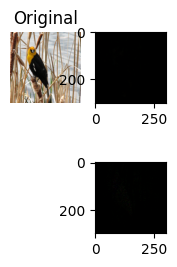

In [56]:
plt.subplot(3,6,1); plt.imshow(plot_im); plt.title("Original"); plt.axis('off')

for i, attr in enumerate(all_attributions):
    slaienc
plt.subplot(3,6,2); plt.imshow()
plt.subplot(3,6,8); plt.imshow(torch.einsum("bcwh->whc", all_attributions[0]["Integrated Gradients"]))
